In [1]:
!git clone https://github.com/fanzeyi/pokemon.json.git --quiet > /dev/null 2>&1
!pip install rembg onnxruntime --quiet > /dev/null 2>&1

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
import json

# JSONファイル読み込み
with open("pokemon.json/pokedex.json", encoding="utf-8") as f:
    pokedex = json.load(f)

# ポケモン名リスト作成
pokemon_names = []
for entry in pokedex:
    name = entry["name"]["english"]  # 英語名を取得
    # URL用に整形（小文字化＋記号除去＋スペース→ハイフン）
    name_url = name.lower().replace(" ", "-").replace(".", "").replace("'", "").replace(":", "").replace("é", "e")
    pokemon_names.append(name_url)  # リストに追加

# 確認出力
print(f"Total Pokémon: {len(pokemon_names)}")  # 総数
print(pokemon_names[:10])  # 先頭10件表示

Total Pokémon: 809
['bulbasaur', 'ivysaur', 'venusaur', 'charmander', 'charmeleon', 'charizard', 'squirtle', 'wartortle', 'blastoise', 'caterpie']


In [4]:
import requests
import os
import time
from tqdm import tqdm
from PIL import Image
from io import BytesIO

# 保存先ディレクトリ
save_dir = "pokemon_images_full"
os.makedirs(save_dir, exist_ok=True)

# ポケモン画像URLテンプレート
base_url = "https://img.pokemondb.net/artwork/large/{}.jpg"

# リサイズ後の画像サイズ
IMG_SIZE = 64

# ダウンロードループ
for name in tqdm(pokemon_names, desc="Downloading Pokémon images"):
    url = base_url.format(name)
    response = requests.get(url)
    if response.status_code == 200:
        try:
            # 画像読み込み → リサイズ → 保存
            img = Image.open(BytesIO(response.content)).convert("RGB")
            img = img.resize((IMG_SIZE, IMG_SIZE), Image.LANCZOS)
            img.save(os.path.join(save_dir, f"{name}.jpg"))
        except:
            continue  # エラー時はスキップ
    # サーバー負荷軽減
    time.sleep(0.5)

# 完了メッセージ
print("✅ All Pokémon images downloaded and resized.")

✅ All Pokémon images downloaded and resized.


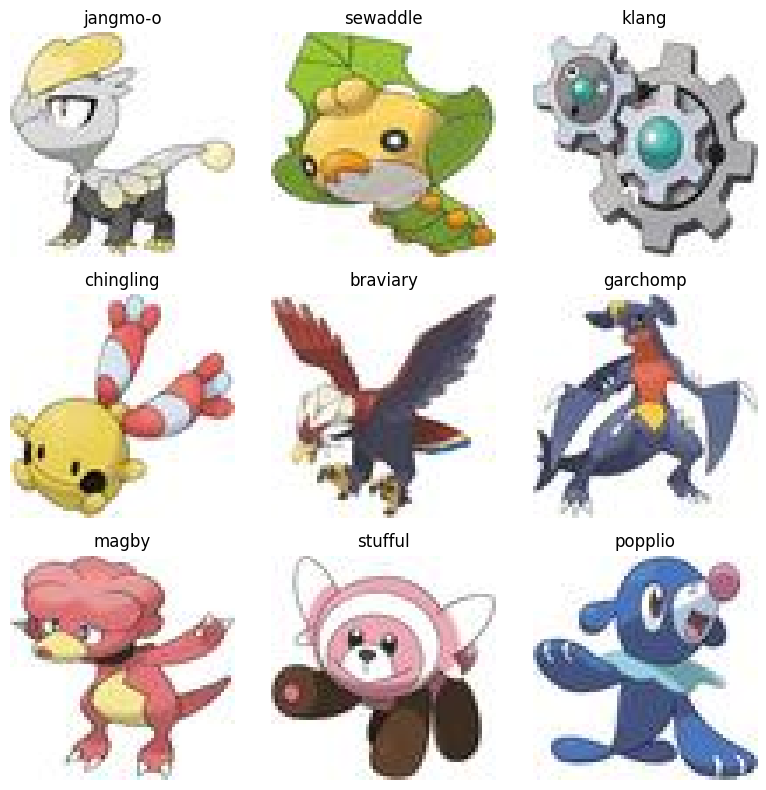

In [5]:
import glob
import random
import matplotlib.pyplot as plt
from PIL import Image

# 画像ファイル一覧を取得
image_paths = glob.glob(os.path.join(save_dir, "*.jpg"))

# いくつかランダムに選ぶ（例：9枚）
num_images = 9
sample_paths = random.sample(image_paths, min(num_images, len(image_paths)))

# プロット
plt.figure(figsize=(8, 8))
for i, path in enumerate(sample_paths):
    img = Image.open(path)
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.title(os.path.basename(path).replace(".jpg", ""))
    plt.axis("off")

plt.tight_layout()
plt.show()

In [6]:
from rembg import remove
import os
from PIL import Image
import glob
from tqdm import tqdm

# 入力元：背景あり画像
input_dir = "pokemon_images_full"
# 出力先：背景除去済み画像
output_dir = "pokemon_images_nobg"
os.makedirs(output_dir, exist_ok=True)

# 入力画像一覧取得
image_paths = glob.glob(os.path.join(input_dir, "*.jpg"))

# 背景除去処理ループ（tqdmで進捗バー表示）
for path in tqdm(image_paths, desc="背景除去中"):
    with open(path, "rb") as i:
        input_image = i.read()
    output_image = remove(input_image)

    # 出力ファイルパス生成（pngに変換して保存）
    out_path = os.path.join(output_dir, os.path.basename(path).replace(".jpg", ".png"))
    with open(out_path, "wb") as o:
        o.write(output_image)

print("✅ 全画像の背景除去完了")

背景除去中:   0%|          | 0/802 [00:00<?, ?it/s]Downloading data from 'https://github.com/danielgatis/rembg/releases/download/v0.0.0/u2net.onnx' to file '/root/.u2net/u2net.onnx'.

  0%|                                               | 0.00/176M [00:00<?, ?B/s]
  4%|█▍                                    | 6.50M/176M [00:00<00:02, 64.9MB/s]
  9%|███▏                                  | 15.0M/176M [00:00<00:02, 76.7MB/s]
 13%|█████                                 | 23.3M/176M [00:00<00:01, 79.6MB/s]
 18%|██████▋                               | 31.3M/176M [00:00<00:01, 77.1MB/s]
 22%|████████▌                             | 39.4M/176M [00:00<00:01, 78.8MB/s]
 28%|██████████▍                           | 48.4M/176M [00:00<00:01, 82.4MB/s]
 32%|████████████▎                         | 57.1M/176M [00:00<00:01, 83.9MB/s]
 37%|██████████████▏                       | 65.5M/176M [00:00<00:01, 83.9MB/s]
 42%|███████████████▉                      | 74.1M/176M [00:00<00:01, 84.5MB/s]
 47%|████████████████

✅ 全画像の背景除去完了


In [7]:
import glob
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# 背景除去済みのPNG画像ファイルを取得
image_paths = glob.glob(os.path.join("pokemon_images_nobg", "*.png"))

# 画像の前処理関数
def preprocess_image(path):
    img = load_img(path, target_size=(IMG_SIZE, IMG_SIZE))  # リサイズ読み込み
    img = img_to_array(img)  # NumPy配列に変換
    img = (img - 127.5) / 127.5  # [-1, 1] に正規化（GAN用）
    return img

# 全画像を前処理して NumPy 配列にまとめる
all_images = np.array([preprocess_image(p) for p in image_paths])

# 読み込んだ画像数と形状を確認
print(f"Loaded {all_images.shape[0]} images, shape: {all_images.shape[1:]}")

# データセットのバッファサイズとバッチサイズ設定
BUFFER_SIZE = all_images.shape[0]
BATCH_SIZE = 32

import tensorflow as tf

# TensorFlow のデータセットを作成（シャッフル + バッチ化）
train_dataset = tf.data.Dataset.from_tensor_slices(all_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

Loaded 802 images, shape: (64, 64, 3)


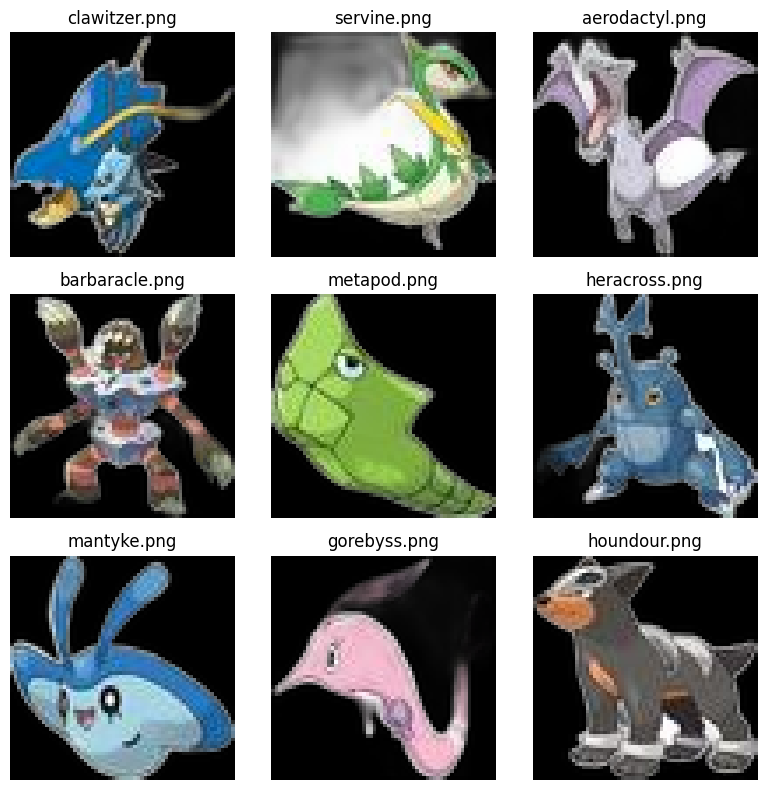

In [8]:
import glob
import random
import matplotlib.pyplot as plt
from PIL import Image

# 背景除去済みPNG画像を確認
image_paths = glob.glob("pokemon_images_nobg/*.png")
sample_paths = random.sample(image_paths, min(9, len(image_paths)))

plt.figure(figsize=(8, 8))
for i, path in enumerate(sample_paths):
    img = Image.open(path).convert("RGB")  # αチャンネル無視してRGBとして確認
    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    plt.title(os.path.basename(path))
    plt.axis("off")

plt.tight_layout()
plt.show()

In [9]:
from tensorflow.keras.layers import Dense, BatchNormalization, Conv2DTranspose, Reshape
from tensorflow.keras.layers import LeakyReLU, Conv2D, Dropout, Flatten, Add, UpSampling2D

# ResBlock for Generator (UpSampling block)
class ResBlockUp(tf.keras.layers.Layer):
    def __init__(self, filters):
        super(ResBlockUp, self).__init__()
        self.upsample = UpSampling2D()
        self.conv1 = Conv2D(filters, (3,3), padding='same')
        self.bn1 = BatchNormalization()
        self.relu1 = LeakyReLU()

        self.conv2 = Conv2D(filters, (3,3), padding='same')
        self.bn2 = BatchNormalization()

        self.shortcut_conv = Conv2D(filters, (1,1), padding='same')
        self.shortcut_bn = BatchNormalization()
        self.relu_out = LeakyReLU()

    def call(self, x, training=True):
        shortcut = self.upsample(x)
        shortcut = self.shortcut_conv(shortcut)
        shortcut = self.shortcut_bn(shortcut, training=training)

        x = self.upsample(x)
        x = self.conv1(x)
        x = self.bn1(x, training=training)
        x = self.relu1(x)

        x = self.conv2(x)
        x = self.bn2(x, training=training)

        x = Add()([x, shortcut])
        x = self.relu_out(x)
        return x

# Generator
class Generator(tf.keras.Model):
    def __init__(self):
        super(Generator, self).__init__()
        self.fc = Dense(8*8*256, use_bias=False)
        self.bn_fc = BatchNormalization()
        self.relu_fc = LeakyReLU()

        self.reshape = Reshape((8, 8, 256))

        self.resblock1 = ResBlockUp(128)
        self.resblock2 = ResBlockUp(64)
        self.resblock3 = ResBlockUp(32)

        self.conv_final = Conv2D(3, (3,3), padding='same', activation='tanh')

    def call(self, x, training=True):
        x = self.fc(x)
        x = self.bn_fc(x, training=training)
        x = self.relu_fc(x)

        x = self.reshape(x)

        x = self.resblock1(x, training=training)
        x = self.resblock2(x, training=training)
        x = self.resblock3(x, training=training)

        x = self.conv_final(x)
        return x

# ResBlock for Discriminator (DownSampling block)
class ResBlockDown(tf.keras.layers.Layer):
    def __init__(self, filters):
        super(ResBlockDown, self).__init__()
        self.conv1 = Conv2D(filters, (3,3), strides=2, padding='same')
        self.relu1 = LeakyReLU()
        self.conv2 = Conv2D(filters, (3,3), padding='same')
        self.relu2 = LeakyReLU()

        self.shortcut_conv = Conv2D(filters, (1,1), strides=2, padding='same')

    def call(self, x, training=True):
        shortcut = self.shortcut_conv(x)

        x = self.conv1(x)
        x = self.relu1(x)
        x = self.conv2(x)

        x = Add()([x, shortcut])
        x = self.relu2(x)
        return x

# Discriminator
class Discriminator(tf.keras.Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.resblock1 = ResBlockDown(64)
        self.resblock2 = ResBlockDown(128)
        self.resblock3 = ResBlockDown(256)

        self.flatten = Flatten()
        self.fc = Dense(1)

    def call(self, x, training=True):
        x = self.resblock1(x, training=training)
        x = self.resblock2(x, training=training)
        x = self.resblock3(x, training=training)

        x = self.flatten(x)
        x = self.fc(x)
        return x

In [10]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output) * 0.9, real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator = Generator()
discriminator = Discriminator()

generator_optimizer = tf.keras.optimizers.Adam(5e-5, beta_1=0.5, beta_2=0.999)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5, beta_2=0.999)


EPOCHS = 500
noise_dim = 100
num_examples_to_generate = 16
seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [ ]:
# Optimizer → 学習率調整（collapse防止）
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5, beta_2=0.999)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5, beta_2=0.999)

# 固定seed作成 → 進捗比較用
fixed_seed = tf.random.normal([num_examples_to_generate, noise_dim])

# 画像保存＋Notebookに表示
import matplotlib.pyplot as plt

def generate_and_save_images(model, epoch, seed):
    predictions = model(seed, training=False)
    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        img = (predictions[i, :, :, :] * 127.5 + 127.5).numpy().astype(np.uint8)
        plt.subplot(4, 4, i+1)
        plt.imshow(img)
        plt.axis('off')
    plt.savefig(f'pokemon_image_at_epoch_{epoch:04d}.png')
    plt.show()  # Notebookに表示
    plt.close()

# train_step（変更なし）
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

# train関数 → fixed_seedでgenerate_and_save_imagesを呼ぶ
def train(dataset, epochs):
    for epoch in range(epochs):
        for image_batch in dataset:
            train_step(image_batch)

        # 毎エポック後に画像をNotebookに表示＋保存
        generate_and_save_images(generator, epoch + 1, fixed_seed)
        print(f'Epoch {epoch+1}/{epochs} done ✅')

# --- ここから実行部分 ---
train(train_dataset, 497)

# GIF作成（この部分は変更不要 → 最後に1回だけ実行でOK）
import imageio
import glob

anim_file = 'pokemon_dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('pokemon_image_at_epoch_*.png')
    filenames = sorted(filenames)
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
    # 最後の画像をもう1枚追加
    image = imageio.imread(filenames[-1])
    writer.append_data(image)

print(f'GIF saved to {anim_file}')

In [ ]:
# 追加で500エポック回す
train(train_dataset, 500)

In [15]:
import imageio
import glob
from PIL import Image

# 小さめGIFの保存先
small_gif_file = 'pokemon_dcgan_small.gif'

# 画像読み込み → サイズ縮小してGIF作成
with imageio.get_writer(small_gif_file, mode='I') as writer:
    filenames = sorted(glob.glob('pokemon_image_at_epoch_*.png'))
    for filename in filenames:
        img = Image.open(filename).resize((256, 256))  # ← 小さめサイズにする
        writer.append_data(np.array(img))

print(f'Small GIF saved to {small_gif_file}')

Small GIF saved to pokemon_dcgan_small.gif


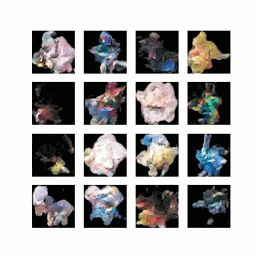

In [16]:
display(IPyImage(filename='pokemon_dcgan_small.gif'))

In [19]:
# train関数 → 50エポック毎 + 最終エポックのみ画像保存

def train(dataset, epochs):
    for epoch in range(epochs):
        for image_batch in dataset:
            train_step(image_batch)

        # 50エポックごと または 最終エポック だけ保存
        if (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            generate_and_save_images(generator, epoch + 1, fixed_seed)
            print(f'✅ Image saved at epoch {epoch+1}')

        print(f'Epoch {epoch+1}/{epochs} done ✅')

Epoch 1/500 done ✅
Epoch 2/500 done ✅
Epoch 3/500 done ✅
Epoch 4/500 done ✅
Epoch 5/500 done ✅
Epoch 6/500 done ✅
Epoch 7/500 done ✅
Epoch 8/500 done ✅
Epoch 9/500 done ✅


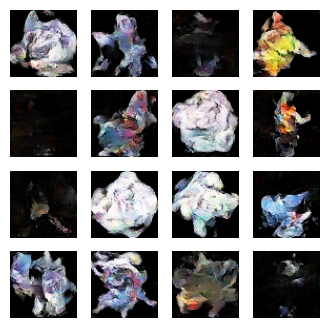

✅ Image saved at epoch 10
Epoch 10/500 done ✅
Epoch 11/500 done ✅
Epoch 12/500 done ✅
Epoch 13/500 done ✅
Epoch 14/500 done ✅
Epoch 15/500 done ✅
Epoch 16/500 done ✅
Epoch 17/500 done ✅
Epoch 18/500 done ✅
Epoch 19/500 done ✅


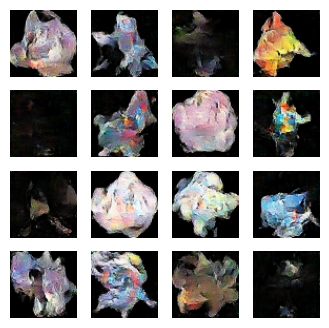

✅ Image saved at epoch 20
Epoch 20/500 done ✅
Epoch 21/500 done ✅
Epoch 22/500 done ✅
Epoch 23/500 done ✅
Epoch 24/500 done ✅
Epoch 25/500 done ✅
Epoch 26/500 done ✅
Epoch 27/500 done ✅
Epoch 28/500 done ✅
Epoch 29/500 done ✅


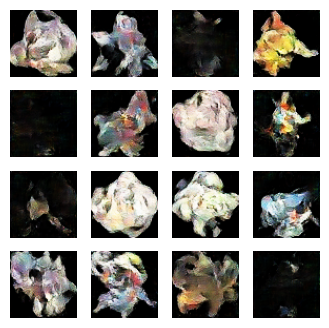

✅ Image saved at epoch 30
Epoch 30/500 done ✅
Epoch 31/500 done ✅
Epoch 32/500 done ✅
Epoch 33/500 done ✅
Epoch 34/500 done ✅
Epoch 35/500 done ✅
Epoch 36/500 done ✅
Epoch 37/500 done ✅
Epoch 38/500 done ✅
Epoch 39/500 done ✅


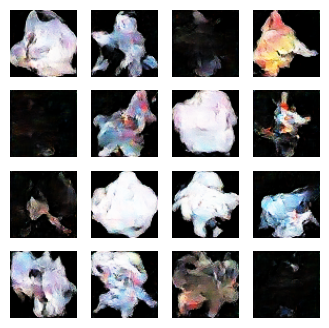

✅ Image saved at epoch 40
Epoch 40/500 done ✅
Epoch 41/500 done ✅
Epoch 42/500 done ✅
Epoch 43/500 done ✅
Epoch 44/500 done ✅
Epoch 45/500 done ✅


In [ ]:
train(train_dataset, 500)